In [1]:
# Basic libraries

import numpy as np
import torch
import torch.nn as nn
import torch.utils.data
import torchvision.utils as vutils
import torchvision.datasets as vdatasets
import torchvision.transforms as T
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
from time import time



In [2]:
# do we have a gpu?
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device.type)

Device: cpu


In [3]:
# do we want to set a random seed, for reproducibility?

randomSeed = None

if randomSeed:
    torch.manual_seed(randomSeed)
    rng = np.random.default_rng(randomSeed)
    random.seed(randomSeed)
    if device.type == 'cuda':
        torch.cuda.manual_seed_all(randomSeed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
else:
    rng = np.random.default_rng()

print("Random Seed:", randomSeed)

Random Seed: None


In [4]:
# Some global parameters

image_size = 64      # 64x64 pixels

image_channels = 3   # RGB, 3 channels

ngpu = 1 if device.type == 'cuda' else 0

num_workers = 4   # for DataLoader
pin = (device.type == 'cuda')    # for DataLoader

In [5]:
# --------------------------------
# LOAD DATA
# --------------------------------

CelebA_dataset = vdatasets.ImageFolder(root='./CelebA/images',
                                transform=T.Compose([
                                    T.Resize(image_size),
                                    T.CenterCrop(image_size),
                                    T.ToTensor(),
                                    T.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                ]))


# Set up train vs test sets

total_count = len(CelebA_dataset)
indices = np.arange(total_count, dtype=int)
rng.shuffle(indices)

train_count = 180000
train_indices = indices[:train_count]
test_indices = indices[train_count:]

CelebA_trainset = torch.utils.data.Subset(CelebA_dataset, train_indices)
CelebA_testset = torch.utils.data.Subset(CelebA_dataset, test_indices)
print("Train:", len(CelebA_trainset),"\tTest:", len(CelebA_testset))


Train: 180000 	Test: 22599


In [6]:
# helpers for showing images and saving them

import datetime

def get_figure_filename_now(filestem):
    """Simple timestamped figure filename"""
    timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
    return f"{filestem}_{timestamp}.jpg"
    
def show_examples(images, nrow, width=10, title = "", filestem=None):
    """Show a grid of images using matplotlib."""
    n_images = images.size(0)
    n_rows = np.ceil(n_images / nrow)
    height = width*n_rows / nrow
    images = (images+1)/2   # return pixel values to [0,1]
    grid = vutils.make_grid(images, nrow=nrow, padding=2, normalize=False)

    plt.figure(figsize=(width, height))
    plt.axis("off")
    if title:
        plt.title(title)
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    if filestem:
        plt.savefig(get_figure_filename_now(filestem))
    plt.show()
    plt.close()
 

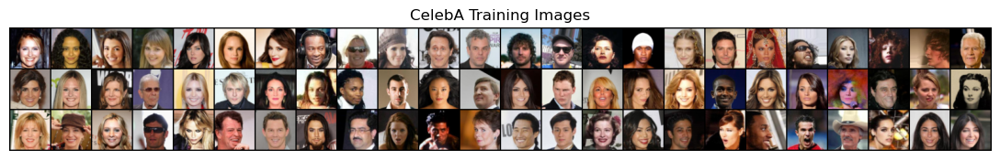

In [7]:
# SHOW EXAMPLES OF TRAINING IMAGES

num_images = 24*3

dataloader = torch.utils.data.DataLoader(CelebA_dataset, batch_size=num_images,
                                         shuffle=True, num_workers=num_workers, pin_memory=pin)
one_batch = next(iter(dataloader))

show_examples(one_batch[0], nrow=24, width=14, title="CelebA Training Images")

In [8]:
# Find the median Euclidean distance between image vectors in the dataset
# We will choose the Gaussian sigma to be half of this median distance

num_dist = 10000
dataloader = torch.utils.data.DataLoader(CelebA_dataset, batch_size=num_dist,
                                         shuffle=True, num_workers=num_workers, pin_memory=pin)
data_iter = iter(dataloader)
batch1 = next(data_iter)[0].view(num_dist, -1)
batch2 = next(data_iter)[0].view(num_dist, -1)

sum_sq = ((batch1 - batch2)**2).sum(dim=1)
distance = torch.sqrt(sum_sq)
median_dist = torch.median(distance).detach().numpy()
print("Median distance:",median_dist)

Median distance: 80.77832


In [9]:
# --------------------------------
# Generator Code from Martin Arjovsky Github Wasserstein GAN
# https://github.com/martinarjovsky/WassersteinGAN
# BSD 3-Clause License
# 
# Copyright (c) 2017, Martin Arjovsky (NYU), Soumith Chintala (Facebook), Leon Bottou (Facebook)
# All rights reserved.
# 
# Redistribution and use in source and binary forms, with or without
# modification, are permitted provided that the following conditions are met:
# 
# * Redistributions of source code must retain the above copyright notice, this
#   list of conditions and the following disclaimer.
# 
# * Redistributions in binary form must reproduce the above copyright notice,
#   this list of conditions and the following disclaimer in the documentation
#   and/or other materials provided with the distribution.
# 
# * Neither the name of the copyright holder nor the names of its
#   contributors may be used to endorse or promote products derived from
#   this software without specific prior written permission.
# 
# THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS"
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE
# IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE
# DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE
# FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL
# DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR
# SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER
# CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY,
# OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE
# OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.
# --------------------------------

nz = 100  # size of latent vector (input to generator)
ngf = 64  # size of feature maps in generator

class DCGAN_G(nn.Module):   # from Martin Arjovsky Github Wasserstein GAN
    def __init__(self, isize, nz, nc, ngf, ngpu, n_extra_layers=0):
        super(DCGAN_G, self).__init__()
        self.ngpu = ngpu
        assert isize % 16 == 0, "isize has to be a multiple of 16"

        cngf, tisize = ngf//2, 4
        while tisize != isize:
            cngf = cngf * 2
            tisize = tisize * 2

        main = nn.Sequential()
        # input is Z, going into a convolution
        main.add_module('initial:{0}-{1}:convt'.format(nz, cngf),
                        nn.ConvTranspose2d(nz, cngf, 4, 1, 0, bias=False))
        main.add_module('initial:{0}:batchnorm'.format(cngf),
                        nn.BatchNorm2d(cngf))
        main.add_module('initial:{0}:relu'.format(cngf),
                        nn.ReLU(True))

        csize, cndf = 4, cngf
        while csize < isize//2:
            main.add_module('pyramid:{0}-{1}:convt'.format(cngf, cngf//2),
                            nn.ConvTranspose2d(cngf, cngf//2, 4, 2, 1, bias=False))
            main.add_module('pyramid:{0}:batchnorm'.format(cngf//2),
                            nn.BatchNorm2d(cngf//2))
            main.add_module('pyramid:{0}:relu'.format(cngf//2),
                            nn.ReLU(True))
            cngf = cngf // 2
            csize = csize * 2

        # Extra layers
        for t in range(n_extra_layers):
            main.add_module('extra-layers-{0}:{1}:conv'.format(t, cngf),
                            nn.Conv2d(cngf, cngf, 3, 1, 1, bias=False))
            main.add_module('extra-layers-{0}:{1}:batchnorm'.format(t, cngf),
                            nn.BatchNorm2d(cngf))
            main.add_module('extra-layers-{0}:{1}:relu'.format(t, cngf),
                            nn.ReLU(True))

        main.add_module('final:{0}-{1}:convt'.format(cngf, nc),
                        nn.ConvTranspose2d(cngf, nc, 4, 2, 1, bias=False))
        main.add_module('final:{0}:tanh'.format(nc),
                        nn.Tanh())
        self.main = main

    def forward(self, input):
        if isinstance(input.data, torch.cuda.FloatTensor) and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, input, range(self.ngpu))
        else: 
            output = self.main(input)
        return output 
        
model = DCGAN_G(image_size, nz, image_channels, ngf, ngpu)
print(model)

DCGAN_G(
  (main): Sequential(
    (initial:100-512:convt): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (initial:512:batchnorm): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (initial:512:relu): ReLU(inplace=True)
    (pyramid:512-256:convt): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (pyramid:256:batchnorm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (pyramid:256:relu): ReLU(inplace=True)
    (pyramid:256-128:convt): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (pyramid:128:batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (pyramid:128:relu): ReLU(inplace=True)
    (pyramid:128-64:convt): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (pyramid:64:batchnorm): BatchNorm2d(64, eps=1e-05, m

In [10]:
def noisemaker(batch_size, device=device):
    """Create an appropriate randomized latent vector for generation"""
    z = torch.randn(batch_size, nz, 1, 1, device=device)
    return z

In [11]:
def weights_init(m):
    """Initialize the model"""
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [12]:
def compute_Gram(x, y, kind='QPM'):
    """Compute the Gram matrix for the combined vectors in x and y"""
    
    dim = x.size(0)     # number of samples; assume x and y have same #
    x = x.view(dim, -1)
    y = y.view(dim, -1)

    scale = torch.tensor(median_dist/2, dtype=x.dtype, device=x.device)   # sigma for the Gaussian kernel
    
    V = torch.cat((x,y),0)
    C = V @ V.T

    D = torch.diagonal(C)
    distsq = D[:,None] + D[None,:] - 2*C  # pairwise distance-squared matrix

    if kind=='QPM':
        gram = torch.exp(-0.5*(distsq/(2*scale**2)))  # square root of Gaussian kernel
    else:
        gram = torch.exp(-(distsq/(2*scale**2)))   # Gaussian kernel

    return gram
    

In [13]:

def calc_loss(gram, kind='QPM', permute=False):
    """Calculate the loss, using either QPM or MMD, for the given Gram matrix."""

    dim = gram.size(0)//2   # half the dimension of the Gram matrix = number of samples (x or y)

    wei=torch.ones(2,dim,device=gram.device)/dim    # weights (c_i in the text)
    wei[1,:] *= -1
    wei = wei.view(-1)
    
    if permute:
        perm_ind = torch.randperm(dim*2, device=gram.device)
        wei = wei[perm_ind]

    eps = 0.0  # regularization; not used here for CelebA
    reg = eps*torch.eye(dim*2, dtype=gram.dtype, device=gram.device)

    if kind=='QPM':
        try:
            H = torch.linalg.cholesky(gram+reg)
            M = H.T @ (wei[:,None]*H)    # same as multiplying diag(wei) @ H
            L = torch.linalg.eigvalsh(M)
        except torch.linalg.LinAlgError:
            dist = wei[:,None]*gram
            L = torch.linalg.eigvals(dist).real
            print("Cholesky failed; using non-Hermitian eigensolver instead")
        loss = L.abs().sum()/2*np.sqrt(2)   # multiply by sqrt(2) for isometry
    else:
        P = torch.dot(wei, gram @ wei)
        loss = torch.sqrt(torch.clamp(P, min=0.0))

    return loss
    

In [14]:
# Test to make sure that the distance between point masses is the same in both metrics

test_num = 10
dataloader = torch.utils.data.DataLoader(CelebA_dataset, batch_size=test_num,
                                         shuffle=True, num_workers=num_workers, pin_memory=pin)
data_iter = iter(dataloader)
batch1 = next(data_iter)[0].view(test_num, -1)
batch2 = next(data_iter)[0].view(test_num, -1)

for i in range(test_num):
    x1 = batch1[i].view(1, -1).to(device)
    x2 = batch2[i].view(1, -1).to(device)

    QPM_dist = calc_loss(compute_Gram(x1, x2, 'QPM'),'QPM').item()
    MMD_dist = calc_loss(compute_Gram(x1, x2, 'MMD'),'MMD').item()
    
    print(f'QPM: {QPM_dist:.5f} \tMMD:{MMD_dist:.5f} \tDiscrepancy: {np.abs(QPM_dist-MMD_dist):.5f}')


QPM: 1.36638 	MMD:1.36638 	Discrepancy: 0.00000
QPM: 1.24814 	MMD:1.24814 	Discrepancy: 0.00000
QPM: 1.30361 	MMD:1.30361 	Discrepancy: 0.00000
QPM: 1.31507 	MMD:1.31507 	Discrepancy: 0.00000
QPM: 1.41017 	MMD:1.41017 	Discrepancy: 0.00000
QPM: 1.36241 	MMD:1.36241 	Discrepancy: 0.00000
QPM: 1.32699 	MMD:1.32699 	Discrepancy: 0.00000
QPM: 1.40174 	MMD:1.40174 	Discrepancy: 0.00000
QPM: 1.32005 	MMD:1.32005 	Discrepancy: 0.00000
QPM: 1.33471 	MMD:1.33471 	Discrepancy: 0.00000


In [15]:
def perm_test(gram, kind='QPM', n_perm=100):
    """Permutation two-sample test, given Gram matrix, report p-value"""

    if n_perm >= 200:
        my_tqdm = tqdm   # show progress bar for 200 or more permutations
    else:
        my_tqdm = lambda x: x
    
    with torch.no_grad():
    
        baseline = calc_loss(gram, kind, permute=False).detach().cpu().numpy()
        perm_stats = np.zeros(n_perm)
        
        for i in my_tqdm(range(n_perm)):
            perm_dist = calc_loss(gram, kind, permute=True).detach().cpu().numpy()
            perm_stats[i] = perm_dist
            
        r = np.sum(perm_stats >= baseline)
        p_value = (r+1) / (n_perm+1)   # continuity corrected

    return p_value
    

In [16]:
# Set up the model and initialize it to prepare for training



n_batch = 1000

# prepare data loader
train_loader = torch.utils.data.DataLoader(CelebA_trainset, batch_size=n_batch,
                                         shuffle=True, num_workers=num_workers, pin_memory=pin)

model_QPM = DCGAN_G(image_size, nz, image_channels, ngf, ngpu).to(device)
model_QPM.apply(weights_init)

model_MMD = DCGAN_G(image_size, nz, image_channels, ngf, ngpu).to(device)
model_MMD.apply(weights_init)

learning_rate = 0.001

print(f'{sum(p.numel() for p in model_QPM.parameters())/1e6:.2f} M parameters')

optimizer_QPM = torch.optim.AdamW(model_QPM.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_MMD = torch.optim.AdamW(model_MMD.parameters(), lr=learning_rate, betas=(0.5, 0.999))

3.58 M parameters


Training started with device: cpu


 12%|█████▏                                    | 22/180 [01:34<10:37,  4.04s/it]

Cholesky failed; using non-Hermitian eigensolver instead


 13%|█████▎                                    | 23/180 [01:37<10:26,  3.99s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:30<00:00,  4.17s/it]


Epoch: 2  	Total time: 25.0 minutes
QPM: 	Loss: 0.407163 	P ~ 0.01


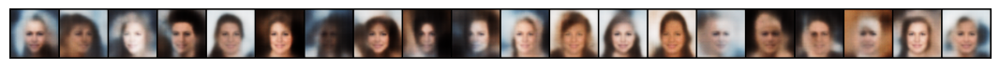

MMD: 	Loss: 0.059503 	P ~ 0.01


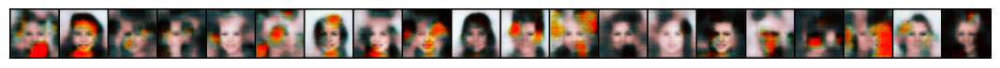

100%|█████████████████████████████████████████| 180/180 [12:22<00:00,  4.12s/it]


Epoch: 4  	Total time: 50.4 minutes
QPM: 	Loss: 0.395937 	P ~ 0.01


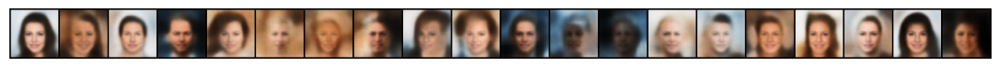

MMD: 	Loss: 0.051407 	P ~ 0.08


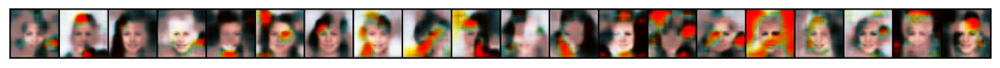

100%|█████████████████████████████████████████| 180/180 [12:29<00:00,  4.16s/it]


Epoch: 6  	Total time: 75.8 minutes
QPM: 	Loss: 0.392010 	P ~ 0.01


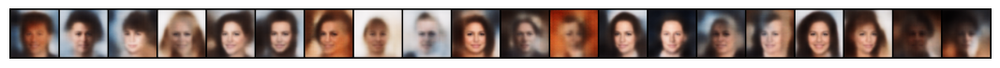

MMD: 	Loss: 0.048770 	P ~ 0.02


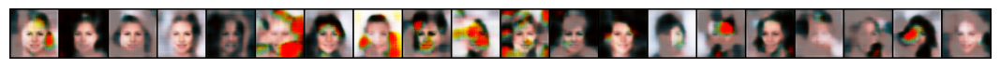

100%|█████████████████████████████████████████| 180/180 [12:42<00:00,  4.24s/it]


Epoch: 8  	Total time: 101.6 minutes
QPM: 	Loss: 0.390709 	P ~ 0.01


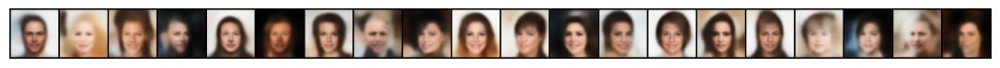

MMD: 	Loss: 0.048071 	P ~ 0.04


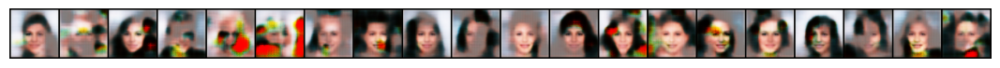

 16%|██████▊                                   | 29/180 [02:02<10:06,  4.02s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:27<00:00,  4.15s/it]


Epoch: 10  	Total time: 127.0 minutes
QPM: 	Loss: 0.388645 	P ~ 0.01


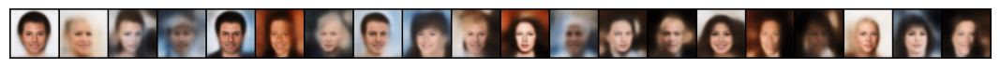

MMD: 	Loss: 0.047091 	P ~ 0.56


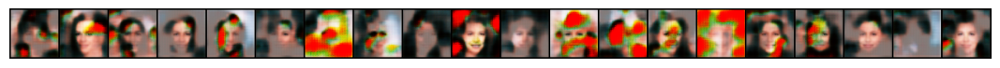

 45%|██████████████████▉                       | 81/180 [05:31<06:42,  4.06s/it]

Cholesky failed; using non-Hermitian eigensolver instead


 40%|████████████████▊                         | 72/180 [04:55<07:13,  4.01s/it]

Cholesky failed; using non-Hermitian eigensolver instead


 88%|████████████████████████████████████▏    | 159/180 [10:45<01:23,  3.99s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:31<00:00,  4.17s/it]


Epoch: 12  	Total time: 152.5 minutes
QPM: 	Loss: 0.387333 	P ~ 0.01


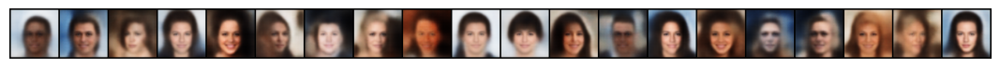

MMD: 	Loss: 0.045930 	P ~ 0.06


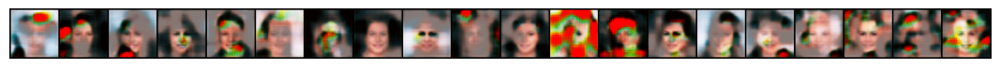

100%|█████████████████████████████████████████| 180/180 [12:26<00:00,  4.15s/it]


Epoch: 14  	Total time: 177.9 minutes
QPM: 	Loss: 0.386365 	P ~ 0.01


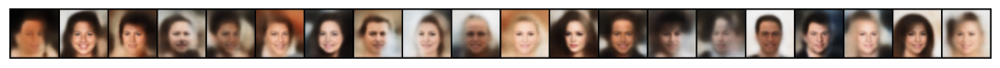

MMD: 	Loss: 0.045856 	P ~ 0.05


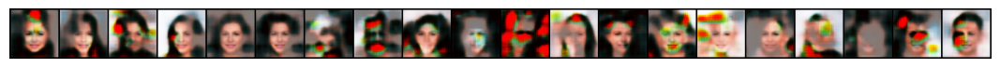

100%|█████████████████████████████████████████| 180/180 [12:29<00:00,  4.16s/it]


Epoch: 16  	Total time: 203.4 minutes
QPM: 	Loss: 0.385851 	P ~ 0.01


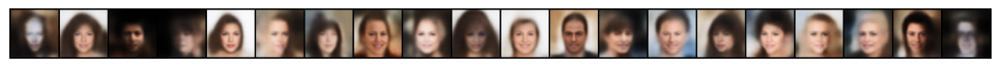

MMD: 	Loss: 0.045402 	P ~ 0.18


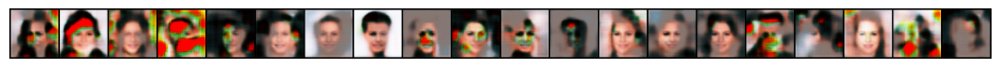

 65%|██████████████████████████▋              | 117/180 [07:55<04:12,  4.01s/it]

Cholesky failed; using non-Hermitian eigensolver instead


 76%|███████████████████████████████▏         | 137/180 [09:14<02:51,  3.99s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:28<00:00,  4.16s/it]


Epoch: 18  	Total time: 228.8 minutes
QPM: 	Loss: 0.385087 	P ~ 0.01


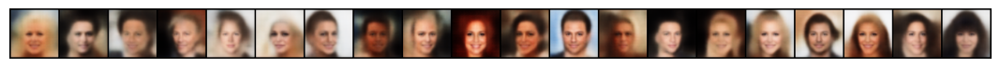

MMD: 	Loss: 0.045273 	P ~ 0.21


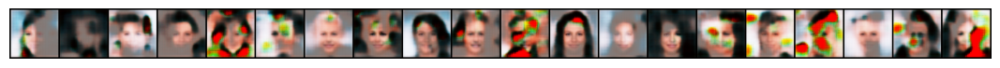

 26%|██████████▋                               | 46/180 [03:09<08:53,  3.98s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:28<00:00,  4.16s/it]


Epoch: 20  	Total time: 254.3 minutes
QPM: 	Loss: 0.384982 	P ~ 0.01


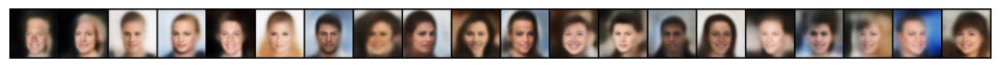

MMD: 	Loss: 0.045183 	P ~ 0.01


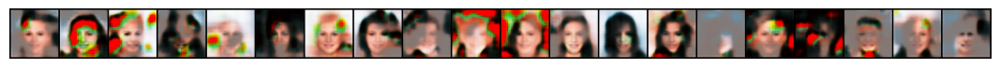

100%|█████████████████████████████████████████| 180/180 [12:33<00:00,  4.19s/it]


Epoch: 22  	Total time: 279.9 minutes
QPM: 	Loss: 0.384314 	P ~ 0.01


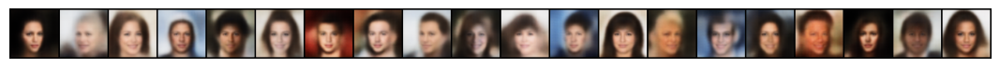

MMD: 	Loss: 0.044672 	P ~ 0.09


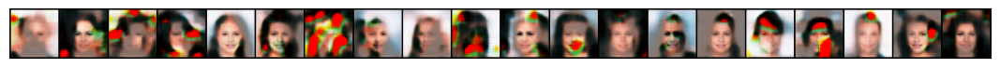

 26%|██████████▋                               | 46/180 [03:10<08:56,  4.00s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:33<00:00,  4.18s/it]


Epoch: 24  	Total time: 305.5 minutes
QPM: 	Loss: 0.383897 	P ~ 0.01


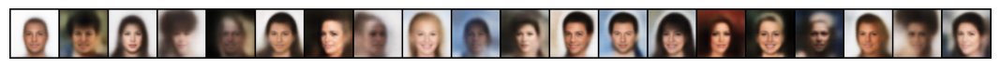

MMD: 	Loss: 0.044692 	P ~ 0.47


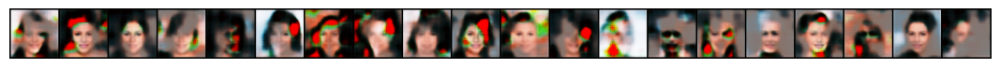

100%|█████████████████████████████████████████| 180/180 [12:33<00:00,  4.19s/it]


Epoch: 26  	Total time: 331.1 minutes
QPM: 	Loss: 0.383994 	P ~ 0.01


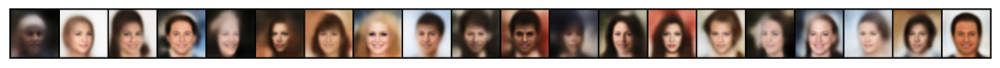

MMD: 	Loss: 0.044232 	P ~ 0.13


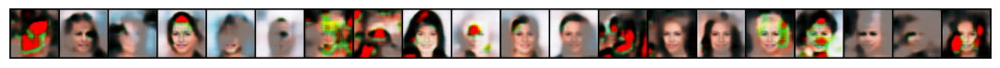

 29%|████████████▎                             | 53/180 [03:40<08:33,  4.04s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:34<00:00,  4.19s/it]


Epoch: 28  	Total time: 356.6 minutes
QPM: 	Loss: 0.383026 	P ~ 0.01


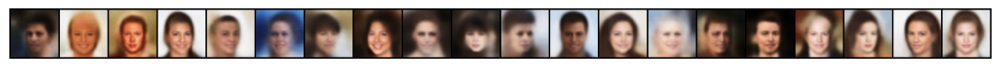

MMD: 	Loss: 0.044078 	P ~ 0.16


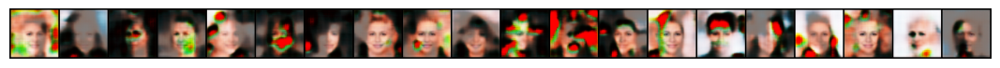

 33%|█████████████▊                            | 59/180 [04:03<08:05,  4.01s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:30<00:00,  4.17s/it]


Epoch: 30  	Total time: 382.2 minutes
QPM: 	Loss: 0.382604 	P ~ 0.01


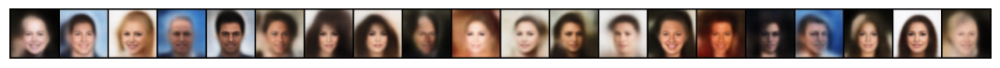

MMD: 	Loss: 0.043761 	P ~ 0.14


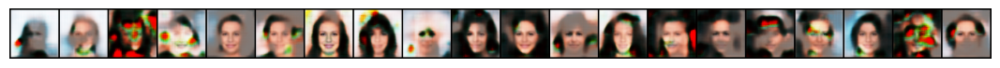

 78%|████████████████████████████████         | 141/180 [09:28<02:35,  3.99s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:25<00:00,  4.14s/it]


Epoch: 32  	Total time: 407.5 minutes
QPM: 	Loss: 0.382972 	P ~ 0.01


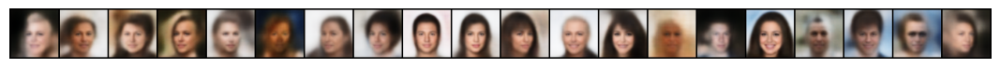

MMD: 	Loss: 0.044131 	P ~ 0.08


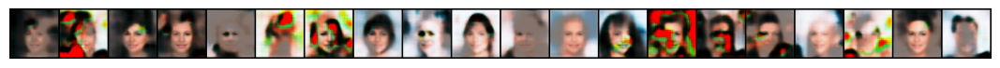

 69%|████████████████████████████▍            | 125/180 [08:26<03:39,  4.00s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:25<00:00,  4.14s/it]


Epoch: 34  	Total time: 432.8 minutes
QPM: 	Loss: 0.382211 	P ~ 0.01


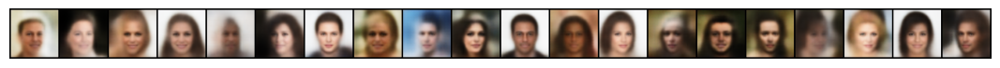

MMD: 	Loss: 0.044017 	P ~ 0.53


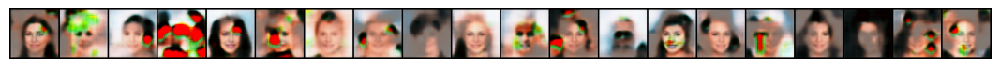

100%|█████████████████████████████████████████| 180/180 [12:25<00:00,  4.14s/it]


Epoch: 36  	Total time: 458.3 minutes
QPM: 	Loss: 0.382109 	P ~ 0.01


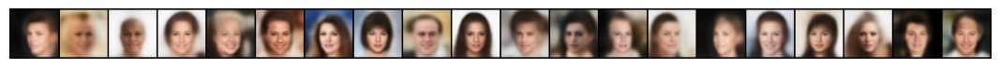

MMD: 	Loss: 0.043796 	P ~ 0.04


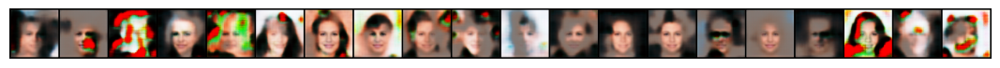

 61%|████████████████████████▊                | 109/180 [07:24<04:48,  4.06s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:31<00:00,  4.17s/it]


Epoch: 38  	Total time: 483.8 minutes
QPM: 	Loss: 0.382061 	P ~ 0.01


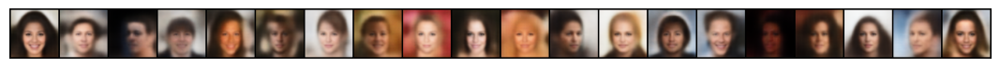

MMD: 	Loss: 0.043646 	P ~ 0.02


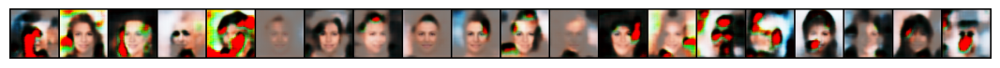

100%|█████████████████████████████████████████| 180/180 [12:26<00:00,  4.15s/it]


Epoch: 40  	Total time: 509.2 minutes
QPM: 	Loss: 0.381696 	P ~ 0.01


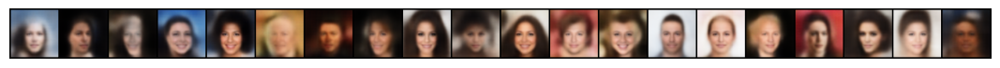

MMD: 	Loss: 0.043233 	P ~ 0.09


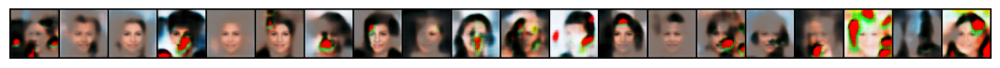

 41%|█████████████████▎                        | 74/180 [05:01<07:06,  4.03s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:25<00:00,  4.14s/it]


Epoch: 42  	Total time: 534.6 minutes
QPM: 	Loss: 0.381358 	P ~ 0.01


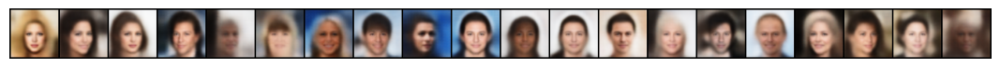

MMD: 	Loss: 0.043266 	P ~ 0.53


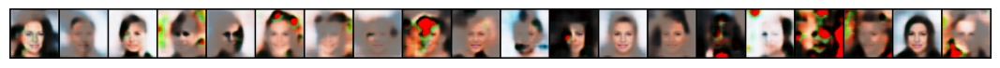

 39%|████████████████▎                         | 70/180 [04:44<07:16,  3.97s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:26<00:00,  4.15s/it]


Epoch: 44  	Total time: 559.9 minutes
QPM: 	Loss: 0.380962 	P ~ 0.01


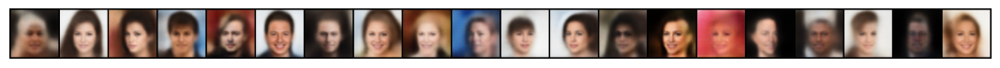

MMD: 	Loss: 0.042844 	P ~ 0.46


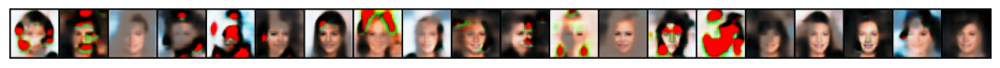

 72%|█████████████████████████████▍           | 129/180 [08:45<03:30,  4.13s/it]

Cholesky failed; using non-Hermitian eigensolver instead


 88%|████████████████████████████████████▏    | 159/180 [10:48<01:25,  4.06s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:33<00:00,  4.19s/it]


Epoch: 46  	Total time: 585.4 minutes
QPM: 	Loss: 0.381343 	P ~ 0.01


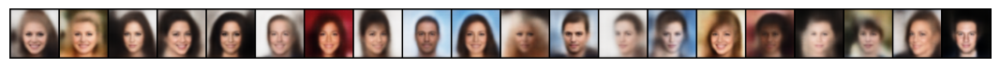

MMD: 	Loss: 0.043204 	P ~ 0.48


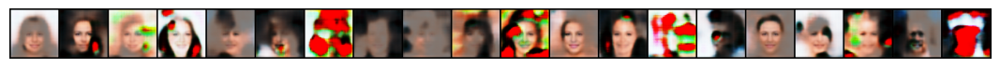

100%|█████████████████████████████████████████| 180/180 [12:32<00:00,  4.18s/it]


Epoch: 48  	Total time: 610.9 minutes
QPM: 	Loss: 0.380950 	P ~ 0.01


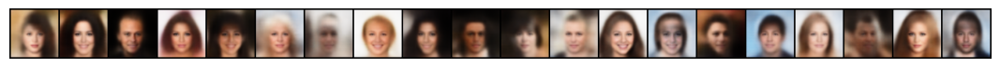

MMD: 	Loss: 0.042960 	P ~ 0.08


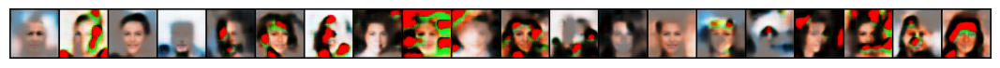

 21%|████████▋                                 | 37/180 [02:34<09:33,  4.01s/it]

Cholesky failed; using non-Hermitian eigensolver instead


100%|█████████████████████████████████████████| 180/180 [12:29<00:00,  4.17s/it]


Epoch: 50  	Total time: 636.4 minutes
QPM: 	Loss: 0.381065 	P ~ 0.01


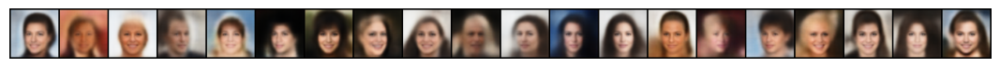

MMD: 	Loss: 0.042600 	P ~ 0.76


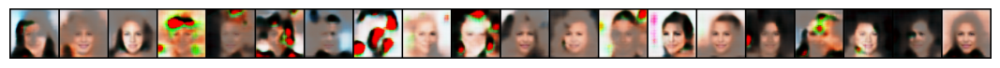

Finished training


In [17]:
# Training loop!

model_QPM.train()
model_MMD.train()

n_epochs = 50    # number of epochs to train the model
report_epoch = 2  # how often to show training statistics and examples

start_time = time()
print("Training started with device:", device.type)

for epoch in range(1, n_epochs+1):
    # monitor training loss
    running_loss_QPM = 0.0
    running_loss_MMD = 0.0
    
    ###################
    # train the model #
    ###################
    for batch in tqdm(train_loader):

        batch = batch[0]
        batch_size = batch.size(0)
        target = batch.to(device).view(batch_size, -1)

        noise_QPM = noisemaker(batch_size)
        output_QPM = model_QPM(noise_QPM).view(batch_size, -1)

        gram_QPM = compute_Gram(output_QPM, target, 'QPM')
        loss_QPM = calc_loss(gram_QPM, 'QPM')
        
        optimizer_QPM.zero_grad(set_to_none=True)
        loss_QPM.backward()
        optimizer_QPM.step()
        running_loss_QPM += loss_QPM.item()

        noise_MMD = noisemaker(batch_size)
        output_MMD = model_MMD(noise_MMD).view(batch_size, -1)
            
        gram_MMD = compute_Gram(output_MMD, target, 'MMD')
        loss_MMD = calc_loss(gram_MMD, 'MMD')

        optimizer_MMD.zero_grad(set_to_none=True)
        loss_MMD.backward()
        optimizer_MMD.step()
        running_loss_MMD += loss_MMD.item()

   
    # print avg training statistics and estimated p-values for most recent epoch
    if (epoch % report_epoch) == 0:
        display_imgs = 20
        total_minutes = (time()-start_time)/60
        print(f'Epoch: {epoch}  \tTotal time: {total_minutes:.1f} minutes')
        N_img = min(batch_size, display_imgs)
    
        avg_loss_QPM = running_loss_QPM/len(train_loader)
        with torch.no_grad():
            p_val_QPM = perm_test(gram_QPM, 'QPM', 100)
            print(f'QPM: \tLoss: {avg_loss_QPM:.6f} \tP ~ {p_val_QPM:.2f}')
            train_examples = output_QPM[:N_img].view(N_img,image_channels,image_size,image_size).cpu()
        show_examples(train_examples, nrow=display_imgs, width=14)
        
        avg_loss_MMD = running_loss_MMD/len(train_loader)
        with torch.no_grad():
            p_val_MMD = perm_test(gram_MMD, 'MMD', 100)
            print(f'MMD: \tLoss: {avg_loss_MMD:.6f} \tP ~ {p_val_MMD:.2f}')
            train_examples = output_MMD[:N_img].view(N_img,image_channels,image_size,image_size).cpu()
        show_examples(train_examples, nrow=display_imgs, width=14)

# done with training; rest of code uses evaluation mode
model_QPM.eval()
model_MMD.eval()

print("Finished training")

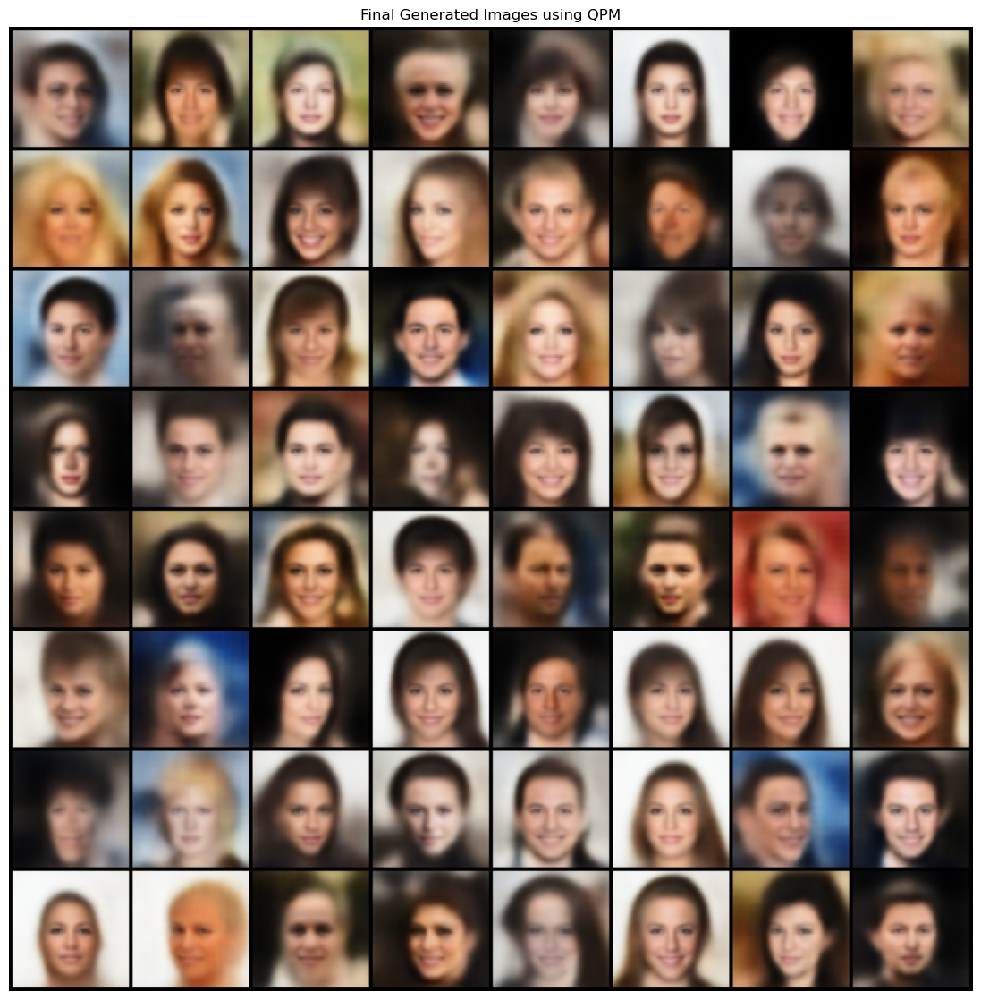

Epochs: 50 	Training Loss: 0.381065 	Total time: 636.4 minutes
Learning rate 0.001
Distance: QPM
Final batch size 1000


In [18]:
# Display and save QPM-generated samples

columns = 8
with torch.no_grad():
    z = noisemaker(columns**2)
    final_gen = model_QPM(z).view(columns**2, image_channels, image_size, image_size).cpu()
show_examples(final_gen, nrow=columns, width=14, title="Final Generated Images using QPM", filestem="CelebA_QPM")

print(f'Epochs: {epoch} \tTraining Loss: {avg_loss_QPM:.6f} \tTotal time: {total_minutes:.1f} minutes')
print("Learning rate", learning_rate)
print("Distance: QPM")
print("Final batch size", batch_size)

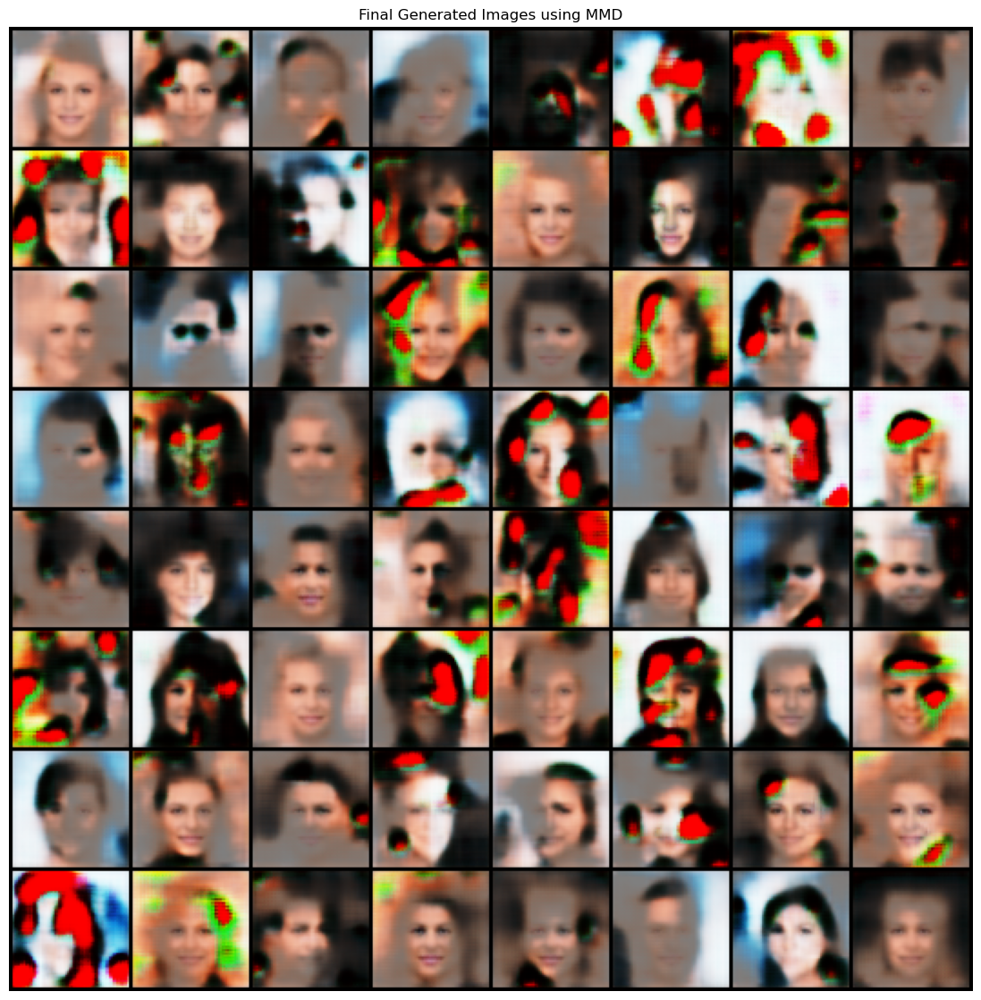

Epochs: 50 	Training Loss: 0.042600 	Total time: 636.4 minutes
Learning rate 0.001
Distance: MMD
Final batch size 1000


In [19]:
# Display and save MMD-generated samples

columns = 8
with torch.no_grad():
    z = noisemaker(columns**2)
    final_gen = model_MMD(z).view(columns**2, image_channels, image_size, image_size).cpu()
show_examples(final_gen, nrow=columns, width=14, title="Final Generated Images using MMD", filestem="CelebA_MMD")

print(f'Epochs: {epoch} \tTraining Loss: {avg_loss_MMD:.6f} \tTotal time: {total_minutes:.1f} minutes')
print("Learning rate", learning_rate)
print("Distance: MMD")
print("Final batch size", batch_size)

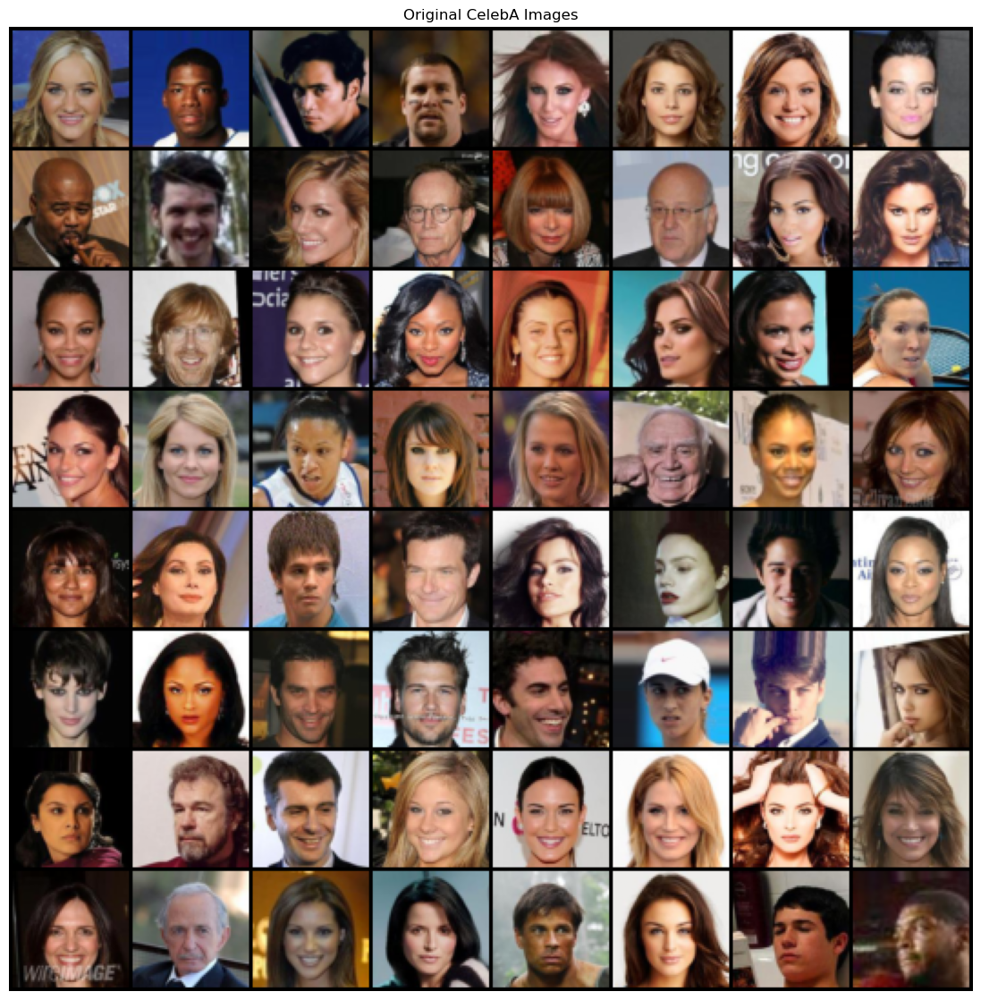

In [20]:
# Display and save original training data, for comparison

num_images = 64

dataloader = torch.utils.data.DataLoader(CelebA_dataset, batch_size=num_images,
                                         shuffle=True, num_workers=num_workers, pin_memory=pin)

orig_examples = next(iter(dataloader))
show_examples(orig_examples[0], nrow=8, width=14, title="Original CelebA Images", filestem="CelebA_data")


In [21]:
# Two-sample testing
# Uses batches from the test/validation set (not used for training)
# Compares each generator with the test data using same metric as used for generation

n_batch = 1000 # batch size for 2-sample testing
n_perm = 1000  # number of permutations

n_tests = 30  # how many independent 2-sample tests should we run?

test_loader = torch.utils.data.DataLoader(CelebA_testset, batch_size=n_batch,
                                         shuffle=True, num_workers=num_workers, pin_memory=pin)

for kind in ['MMD', 'QPM']:
    if kind=='MMD': 
        model = model_MMD
    else:
        model = model_QPM
    
    p_vals = np.zeros(n_tests)
   
    for i in range(n_tests):
    
        orig_batch = next(iter(test_loader))[0]
        batch_size = orig_batch.size(0)
        target = orig_batch.to(device).view(batch_size, -1)
        
        noise = noisemaker(batch_size)
        output = model(noise).view(batch_size, -1)
        gram = compute_Gram(output, target, kind)
        p_vals[i] = perm_test(gram, kind, n_perm)
                
        print(f'Batch: {i+1} \t{kind}: {p_vals[i]:.3f}')

    ave_p = np.average(p_vals)
    
    print('Average:')
    print(f'{kind}: p ~ {ave_p:.3f} over {n_tests} batches')


100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 899.37it/s]

Batch: 1 	MMD: 0.166



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 863.48it/s]

Batch: 2 	MMD: 0.095



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 865.83it/s]

Batch: 3 	MMD: 0.246



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 891.87it/s]

Batch: 4 	MMD: 0.075



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 883.03it/s]

Batch: 5 	MMD: 0.393



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 879.78it/s]

Batch: 6 	MMD: 0.430



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 825.23it/s]

Batch: 7 	MMD: 0.415



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 875.78it/s]

Batch: 8 	MMD: 0.152



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 910.86it/s]

Batch: 9 	MMD: 0.315



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 896.67it/s]

Batch: 10 	MMD: 0.395



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 906.87it/s]

Batch: 11 	MMD: 0.403



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 908.58it/s]

Batch: 12 	MMD: 0.047



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 856.76it/s]

Batch: 13 	MMD: 0.183



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 907.43it/s]

Batch: 14 	MMD: 0.179



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 917.09it/s]

Batch: 15 	MMD: 0.172



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 894.66it/s]

Batch: 16 	MMD: 0.051



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 905.09it/s]

Batch: 17 	MMD: 0.517



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 901.95it/s]

Batch: 18 	MMD: 0.694



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 910.79it/s]

Batch: 19 	MMD: 0.078



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 856.54it/s]

Batch: 20 	MMD: 0.510



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 898.48it/s]

Batch: 21 	MMD: 0.100



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 837.03it/s]

Batch: 22 	MMD: 0.234



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 912.00it/s]

Batch: 23 	MMD: 0.061



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 902.05it/s]

Batch: 24 	MMD: 0.051



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 888.00it/s]

Batch: 25 	MMD: 0.103



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 849.18it/s]

Batch: 26 	MMD: 0.072



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 889.32it/s]

Batch: 27 	MMD: 0.163



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 775.20it/s]

Batch: 28 	MMD: 0.143



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 784.54it/s]

Batch: 29 	MMD: 0.256



100%|██████████████████████████████████████| 1000/1000 [00:01<00:00, 869.78it/s]

Batch: 30 	MMD: 0.191
Average:
MMD: p ~ 0.230 over 30 batches



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.62it/s]

Batch: 1 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 2 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 3 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 4 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 5 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 6 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 7 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.60it/s]

Batch: 8 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 9 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:36<00:00,  3.61it/s]

Batch: 10 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 11 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 12 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 13 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 14 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 15 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 16 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 17 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.60it/s]

Batch: 18 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 19 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 20 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 21 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 22 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.61it/s]

Batch: 23 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.60it/s]

Batch: 24 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:37<00:00,  3.60it/s]

Batch: 25 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:38<00:00,  3.59it/s]

Batch: 26 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:39<00:00,  3.57it/s]

Batch: 27 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:39<00:00,  3.58it/s]

Batch: 28 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:40<00:00,  3.56it/s]

Batch: 29 	QPM: 0.001



100%|███████████████████████████████████████| 1000/1000 [04:40<00:00,  3.57it/s]

Batch: 30 	QPM: 0.001
Average:
QPM: p ~ 0.001 over 30 batches
